In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
from rnanorm import FPKM, TPM
from gtfparse import read_gtf
import re

## Preprocessing

In [2]:
df_gtf = read_gtf("../datasets/gencode.v46.basic.annotation.gtf")

# Remove .1, .2, etc. from gene_id
def remove_version(s):
    return re.sub(r'\.\d+$', '', s)

gene_ids = df_gtf['gene_id'].to_list()
gene_ids = list(map(remove_version, gene_ids))
gene_ids = list(set(gene_ids))

def read_datasets(data_path: str, meta_path: str, gene_ids: list):
    meta_data = pd.read_excel(meta_path)
    data = pd.read_csv(data_path, sep='\t')
    data = data.T
    data = data.iloc[:, data.columns.isin(gene_ids)]
    return data, meta_data


meta_burgos_path = "../datasets/datasets_raw/burgos_dbgap/burgos_dbgap_metadata.xlsx"
data_burgos_path = "../datasets/datasets_raw/burgos_dbgap/burgos_dbgap_counts.txt"
data_burgos_fpkm_path = "../datasets/datasets_processed/fpkm/burgos_dbgap_fpkm.txt"
data_burgos_tpm_path = "../datasets/datasets_processed/tpm/burgos_dbgap_tpm.txt"
data_burgos, meta_burgos = read_datasets(data_burgos_path, meta_burgos_path, gene_ids)

meta_silver_path = "../datasets/datasets_raw/silver_seq/silver_seq_metadata.xlsx"
data_silver_path = "../datasets/datasets_raw/silver_seq/silver_seq_counts.txt"
data_silver_fpkm_path = "../datasets/datasets_processed/fpkm/silver_seq_fpkm.txt"
data_silver_tpm_path = "../datasets/datasets_processed/tpm/silver_seq_tpm.txt"
data_silver, meta_silver = read_datasets(data_silver_path, meta_silver_path, gene_ids)

meta_toden_path = "../datasets/datasets_raw/toden/toden_metadata.xlsx"
data_toden_path = "../datasets/datasets_raw/toden/toden_counts.txt"
data_toden_fpkm_path = "../datasets/datasets_processed/fpkm/toden_fpkm.txt"
data_toden_tpm_path = "../datasets/datasets_processed/tpm/toden_tpm.txt"
data_toden, meta_toden = read_datasets(data_toden_path, meta_toden_path, gene_ids)

def normalize(data: pd.DataFrame, method: str, save_path: str|None=None):
    if method == "fpkm":
        fpkm = FPKM(gtf="../datasets/gencode.v46.basic.annotation.gtf").set_output(transform="pandas")
        df_transformed = fpkm.fit_transform(data)
    elif method == "tpm":
        tpm = TPM(gtf="../datasets/gencode.v46.basic.annotation.gtf").set_output(transform="pandas")
        df_transformed = tpm.fit_transform(data)
    else:
        raise ValueError("Invalid method")
    
    if save_path is not None:
        df_transformed.to_csv(save_path, sep='\t')

    return df_transformed

df_transformed_burgos_fpkm = normalize(data_burgos, "fpkm", data_burgos_fpkm_path)
df_transformed_burgos_tpm = normalize(data_burgos, "tpm", data_burgos_tpm_path)

df_transformed_silver_fpkm = normalize(data_silver, "fpkm", data_silver_fpkm_path)
df_transformed_silver_tpm = normalize(data_silver, "tpm", data_silver_tpm_path)

df_transformed_toden_fpkm = normalize(data_toden, "fpkm", data_toden_fpkm_path)
df_transformed_toden_tpm = normalize(data_toden, "tpm", data_toden_tpm_path)

def transform_h5ad(data: pd.DataFrame, meta: pd.DataFrame, save_path: str):
    adata = sc.AnnData(data)
    adata.obs = meta
    adata.write(save_path)
    return adata

assert (df_transformed_burgos_tpm.index == meta_burgos['biospecimen_repository_sample_id'].to_list()).all()
assert (df_transformed_silver_tpm.index == meta_silver['sample_id_alias'].to_list()).all()
assert (df_transformed_toden_tpm.index == meta_toden['Run'].to_list()).all()

adata_burgos_fpkm = transform_h5ad(df_transformed_burgos_fpkm, meta_burgos, "../datasets/datasets_h5ad/fpkm/burgos_dbgap_fpkm.h5ad")
adata_burgos_tpm = transform_h5ad(df_transformed_burgos_tpm, meta_burgos, "../datasets/datasets_h5ad/tpm/burgos_dbgap_tpm.h5ad")

adata_silver_fpkm = transform_h5ad(df_transformed_silver_fpkm, meta_silver, "../datasets/datasets_h5ad/fpkm/silver_seq_fpkm.h5ad")
adata_silver_tpm = transform_h5ad(df_transformed_silver_tpm, meta_silver, "../datasets/datasets_h5ad/tpm/silver_seq_tpm.h5ad")

adata_toden_fpkm = transform_h5ad(df_transformed_toden_fpkm, meta_toden, "../datasets/datasets_h5ad/fpkm/toden_fpkm.h5ad")
adata_toden_tpm = transform_h5ad(df_transformed_toden_tpm, meta_toden, "../datasets/datasets_h5ad/tpm/toden_tpm.h5ad")

INFO:root:Extracted GTF attributes: ['gene_id', 'gene_type', 'gene_name', 'level', 'tag', 'transcript_id', 'transcript_type', 'transcript_name', 'transcript_support_level', 'havana_transcript', 'exon_number', 'exon_id', 'hgnc_id', 'havana_gene', 'ont', 'protein_id', 'ccdsid', 'artif_dupl']
... storing 'submitted_subject_id' as categorical
... storing 'ApoE' as categorical
... storing 'ClinicalDXSummary' as categorical
... storing 'Control' as categorical
... storing 'AD' as categorical
... storing 'PD' as categorical
... storing 'DLB' as categorical
... storing 'VAD' as categorical
... storing 'PSP' as categorical
... storing 'Plaque.density' as categorical
... storing 'Braak.score' as categorical
... storing 'NIA.R' as categorical
... storing 'LB.Stage' as categorical
... storing 'sn_depigmentation' as categorical
... storing 'apoe_carrier' as categorical
... storing 'apoe_dose' as categorical
... storing 'donor_id_alias' as categorical
... storing 'donor_status_score' as categorical


In [27]:
adata_burgos_fpkm = sc.read("../datasets/datasets_h5ad/fpkm/burgos_dbgap_fpkm.h5ad")
adata_burgos_tpm = sc.read("../datasets/datasets_h5ad/tpm/burgos_dbgap_tpm.h5ad")

adata_silver_fpkm = sc.read("../datasets/datasets_h5ad/fpkm/silver_seq_fpkm.h5ad")
adata_silver_tpm = sc.read("../datasets/datasets_h5ad/tpm/silver_seq_tpm.h5ad")

adata_toden_fpkm = sc.read("../datasets/datasets_h5ad/fpkm/toden_fpkm.h5ad")
adata_toden_tpm = sc.read("../datasets/datasets_h5ad/tpm/toden_tpm.h5ad")

# adata_burgos_fpkm.obs keep only ClinicalDXSummary
adata_burgos_fpkm.obs = adata_burgos_fpkm.obs[['ClinicalDXSummary']]
adata_burgos_tpm.obs = adata_burgos_tpm.obs[['ClinicalDXSummary']]

adata_silver_fpkm.obs = adata_silver_fpkm.obs[["donor_group"]]
adata_silver_tpm.obs = adata_silver_tpm.obs[["donor_group"]]

adata_toden_fpkm.obs = adata_toden_fpkm.obs[["Disease"]]
adata_toden_tpm.obs = adata_toden_tpm.obs[["Disease"]]

adata_burgos_fpkm.obs["AD"] = ["No Disease" if x == "Control" else "Disease" for x in adata_burgos_fpkm.obs["ClinicalDXSummary"]]
adata_burgos_tpm.obs["AD"] = ["No Disease" if x == "Control" else "Disease" for x in adata_burgos_tpm.obs["ClinicalDXSummary"]]

adata_silver_fpkm.obs["AD"] = ["No Disease" if x == "N" else "Disease" for x in adata_silver_fpkm.obs["donor_group"]]
adata_silver_tpm.obs["AD"] = ["No Disease" if x == "N" else "Disease" for x in adata_silver_tpm.obs["donor_group"]]

adata_toden_fpkm.obs["AD"] = ["No Disease" if x == "NCI" else "Disease" for x in adata_toden_fpkm.obs["Disease"]]
adata_toden_tpm.obs["AD"] = ["No Disease" if x == "NCI" else "Disease" for x in adata_toden_tpm.obs["Disease"]]

adata_combined_fpkm = adata_burgos_fpkm.concatenate(adata_silver_fpkm, adata_toden_fpkm, batch_categories=["burgos", "silver", "toden"])
adata_combined_tpm = adata_burgos_tpm.concatenate(adata_silver_tpm, adata_toden_tpm, batch_categories=["burgos", "silver", "toden"])

/opt/homebrew/Caskroom/miniconda/base/envs/CSE_283/lib/python3.11/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/opt/homebrew/Caskroom/miniconda/base/envs/CSE_283/lib/python3.11/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/opt/homebrew/Caskroom/miniconda/base/envs/CSE_283/lib/python3.11/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/opt/homebrew/Caskroom/miniconda/base/envs/CSE_283/lib/python3.11/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/opt/homebrew/Caskroom/minic

## Plotting

In [14]:
sc.set_figure_params(dpi=400, figsize=(8, 6))

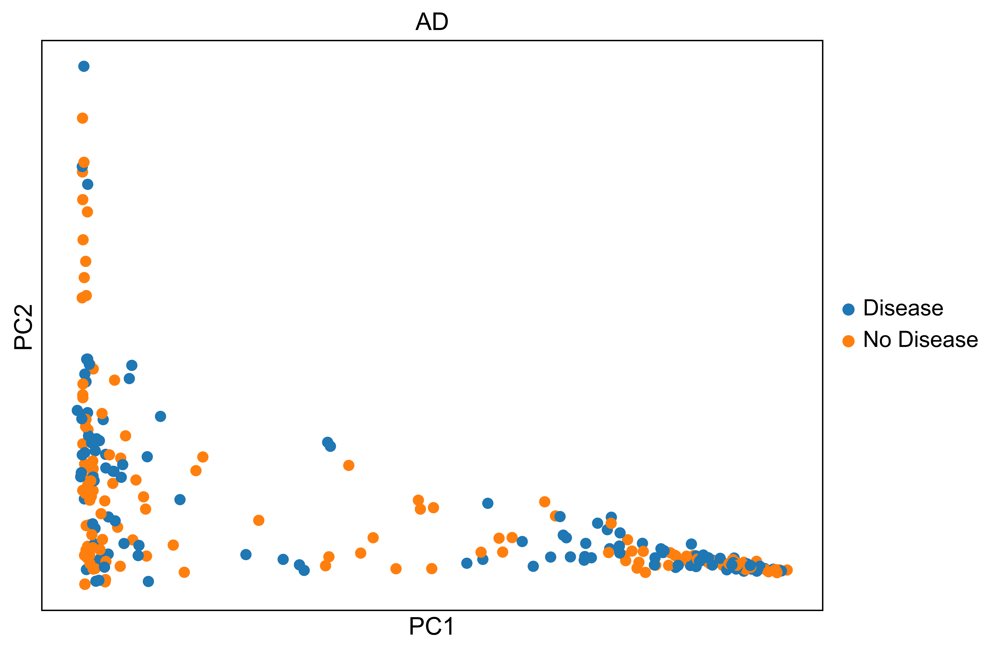

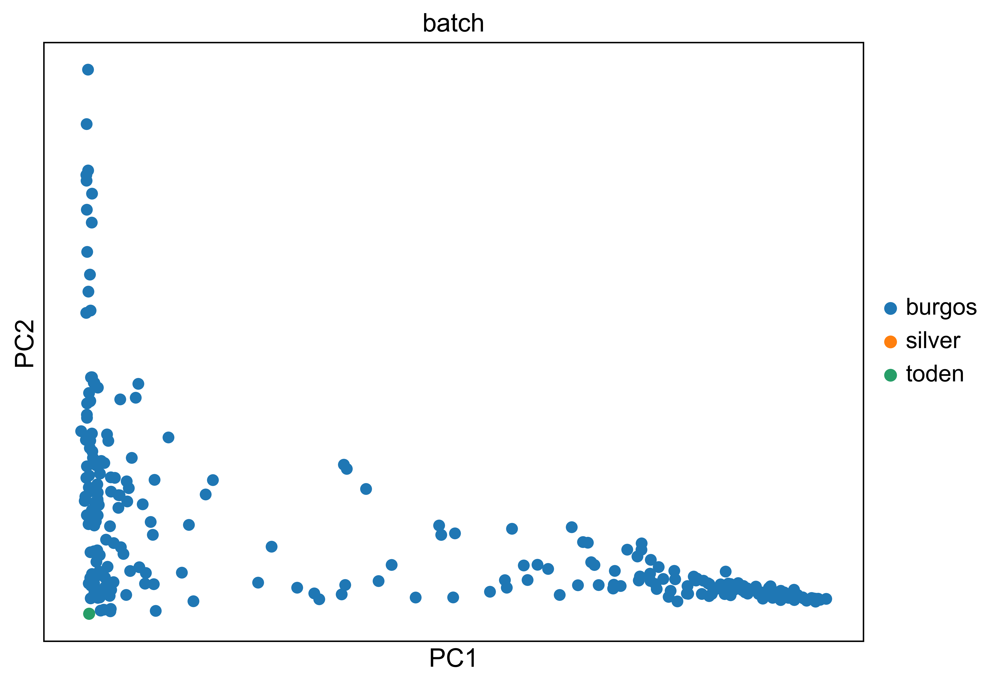

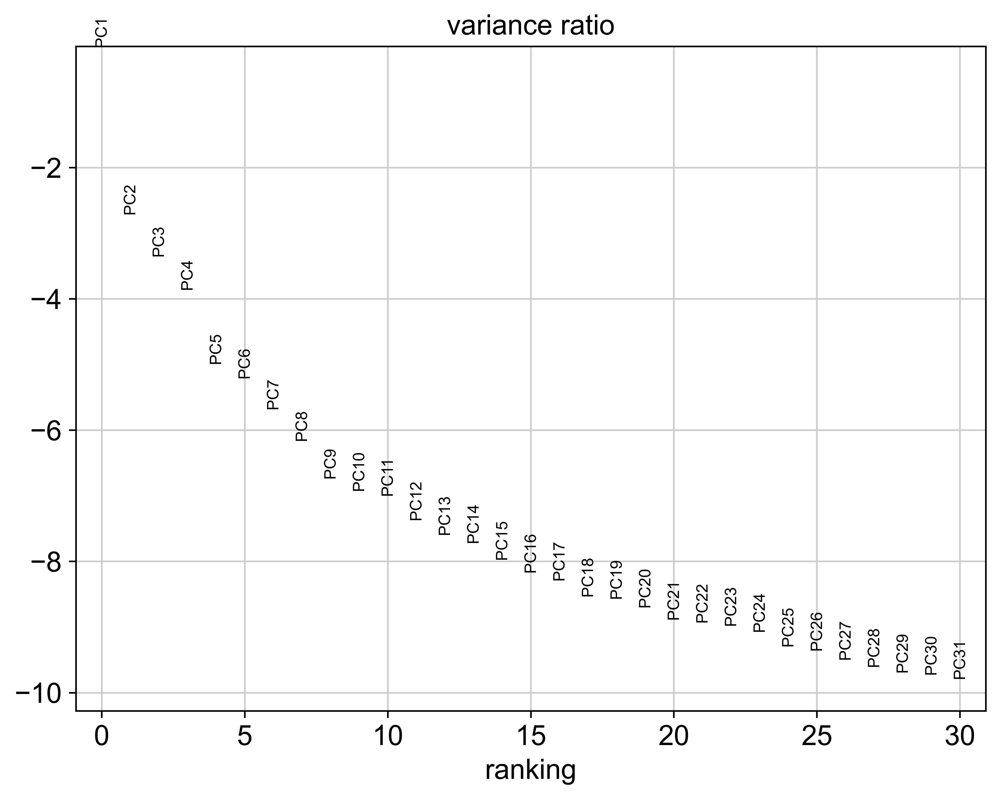

... storing 'AD' as categorical


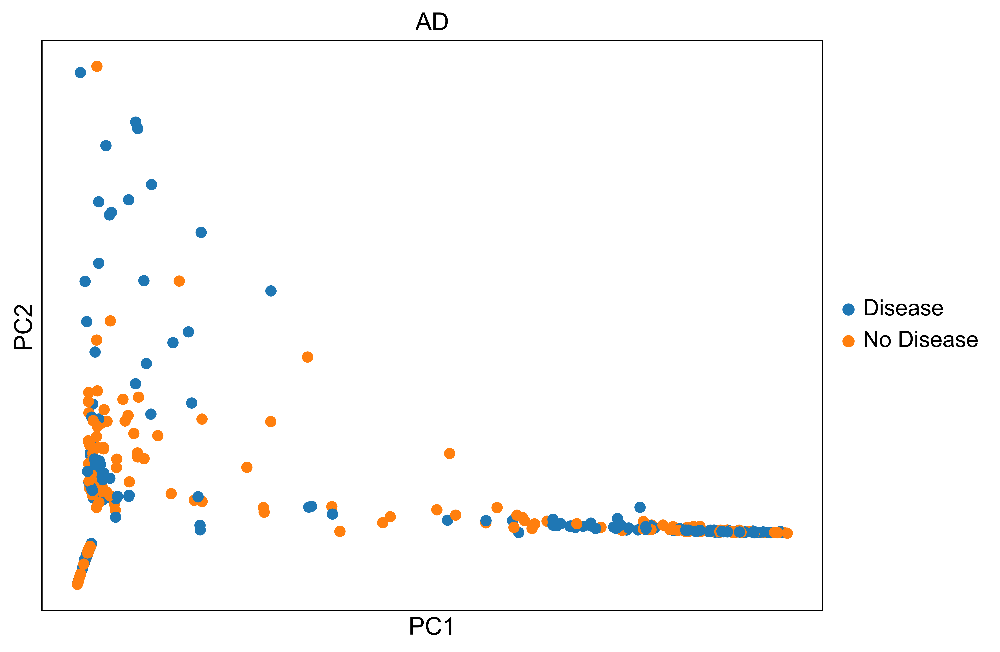

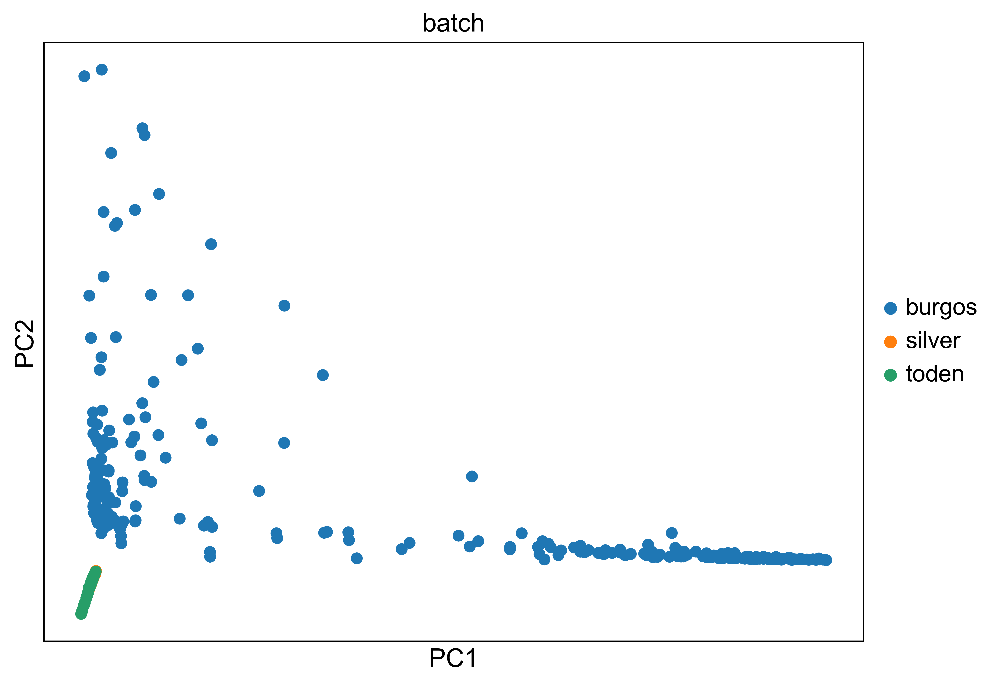

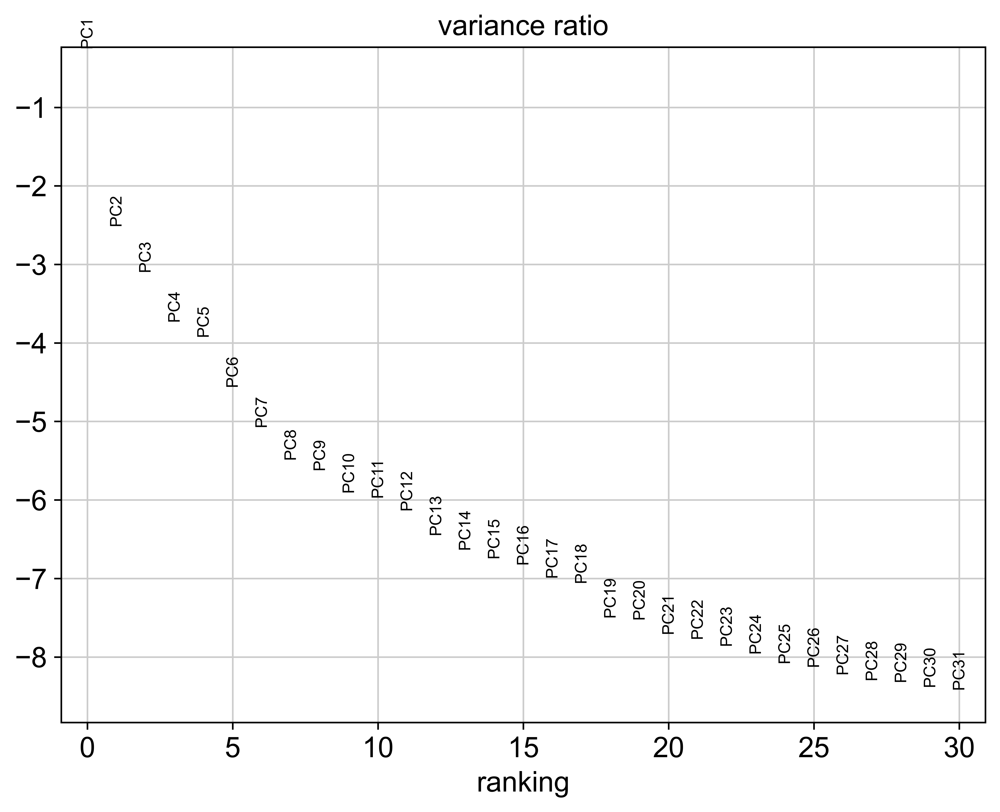

In [17]:
# PCA for FPKM
sc.pp.pca(adata_combined_fpkm)

sc.pl.pca(adata_combined_fpkm, color=["AD"], save="_combined_disease_fpkm.png")
sc.pl.pca(adata_combined_fpkm, color=["batch"], save="_combined_batch_fpkm.png")
sc.pl.pca_variance_ratio(adata_combined_fpkm, log=True, save="_fpkm_variance.png")

# PCA for TPM
sc.pp.pca(adata_combined_tpm)

sc.pl.pca(adata_combined_tpm, color=["AD"], save="_combined_disease_tpm.png")
sc.pl.pca(adata_combined_tpm, color=["batch"], save="_combined_batch_tpm.png")
sc.pl.pca_variance_ratio(adata_combined_tpm, log=True, save="_tpm_variance.png")

/opt/homebrew/Caskroom/miniconda/base/envs/CSE_283/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


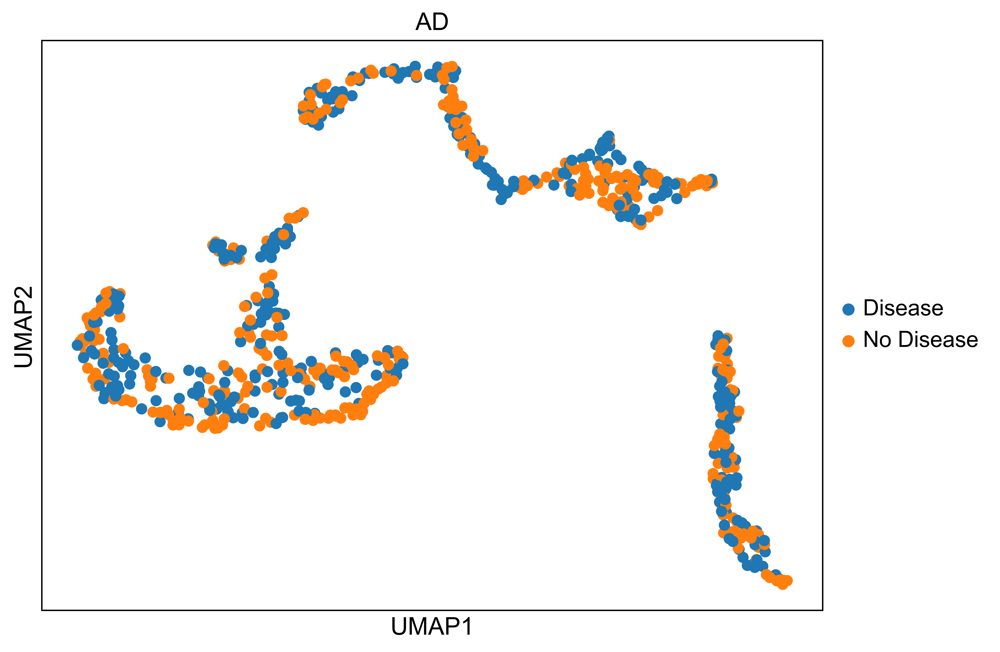

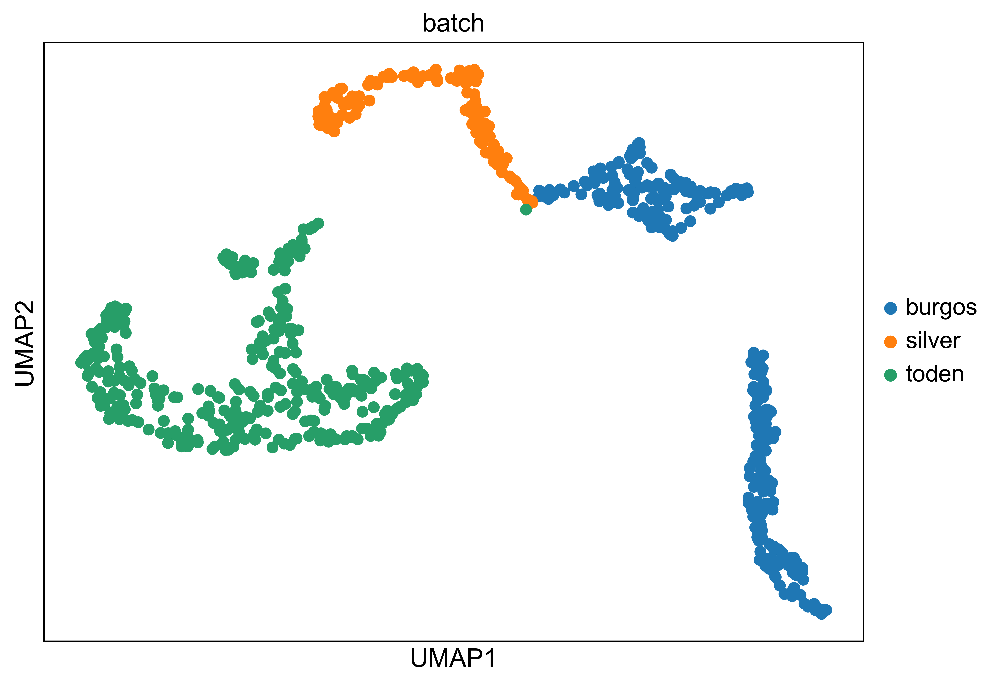

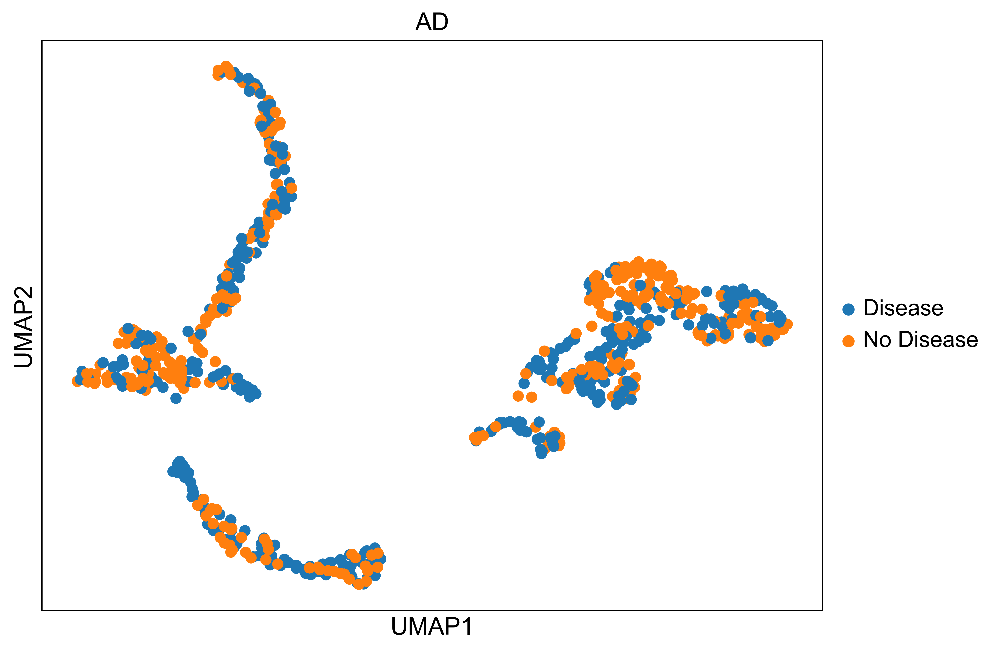

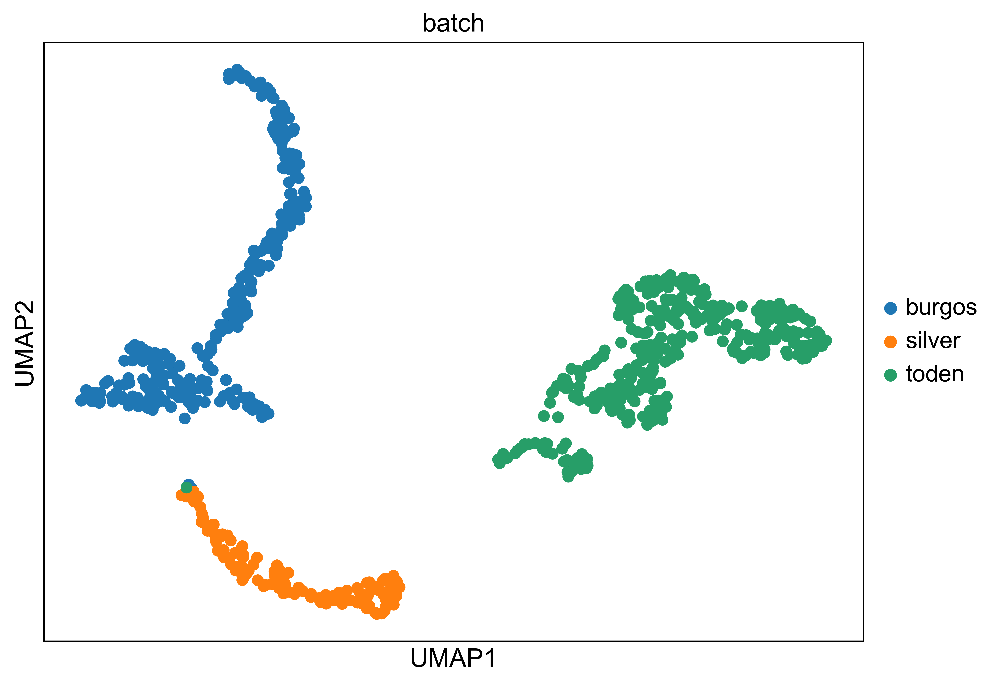

In [18]:
# UMAP
sc.pp.neighbors(adata_combined_fpkm)
sc.tl.umap(adata_combined_fpkm)
sc.pl.umap(adata_combined_fpkm, color=["AD"], save="_combined_disease_fpkm.png")
sc.pl.umap(adata_combined_fpkm, color=["batch"], save="_combined_batch_fpkm.png")

sc.pp.neighbors(adata_combined_tpm)
sc.tl.umap(adata_combined_tpm)
sc.pl.umap(adata_combined_tpm, color=["AD"], save="_combined_disease_tpm.png")
sc.pl.umap(adata_combined_tpm, color=["batch"], save="_combined_batch_tpm.png")

## Filters

In [28]:
sc.pp.normalize_total(adata_combined_fpkm, target_sum=1e4)
sc.pp.log1p(adata_combined_fpkm)

sc.pp.normalize_total(adata_combined_tpm, target_sum=1e4)
sc.pp.log1p(adata_combined_tpm)

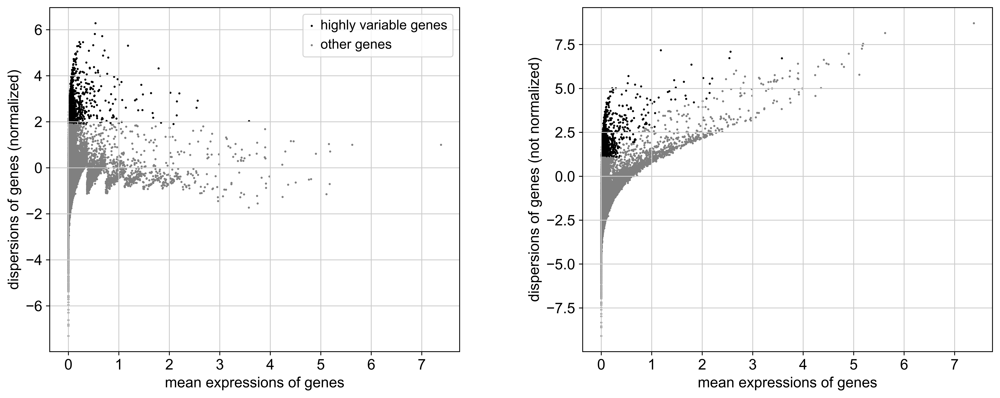

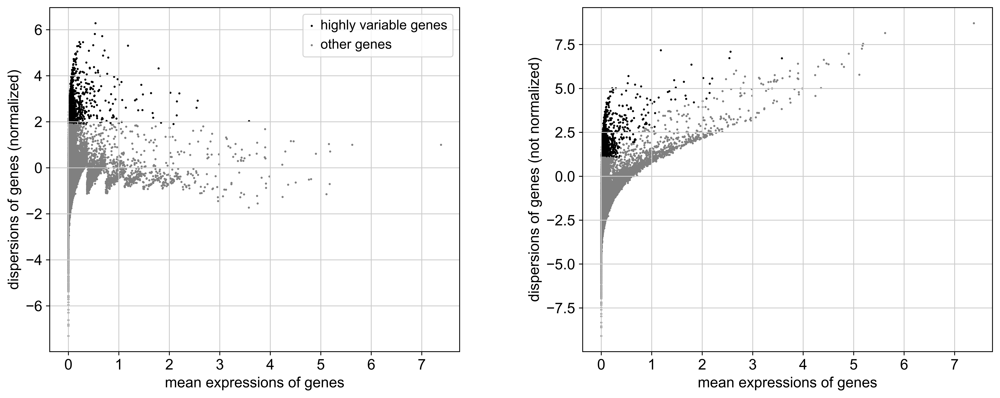

In [29]:
# HVG
sc.pp.highly_variable_genes(adata_combined_fpkm, n_top_genes=2000)
sc.pl.highly_variable_genes(adata_combined_fpkm, save="_fpkm_hvg.png")

sc.pp.highly_variable_genes(adata_combined_tpm, n_top_genes=2000)
sc.pl.highly_variable_genes(adata_combined_tpm, save="_tpm_hvg.png")

# Keep only HVG
adata_combined_hvg_fpkm = adata_combined_fpkm[:, adata_combined_fpkm.var.highly_variable]
adata_combined_hvg_tpm = adata_combined_tpm[:, adata_combined_tpm.var.highly_variable]

         Falling back to preprocessing with `sc.pp.pca` and default params.


... storing 'AD' as categorical


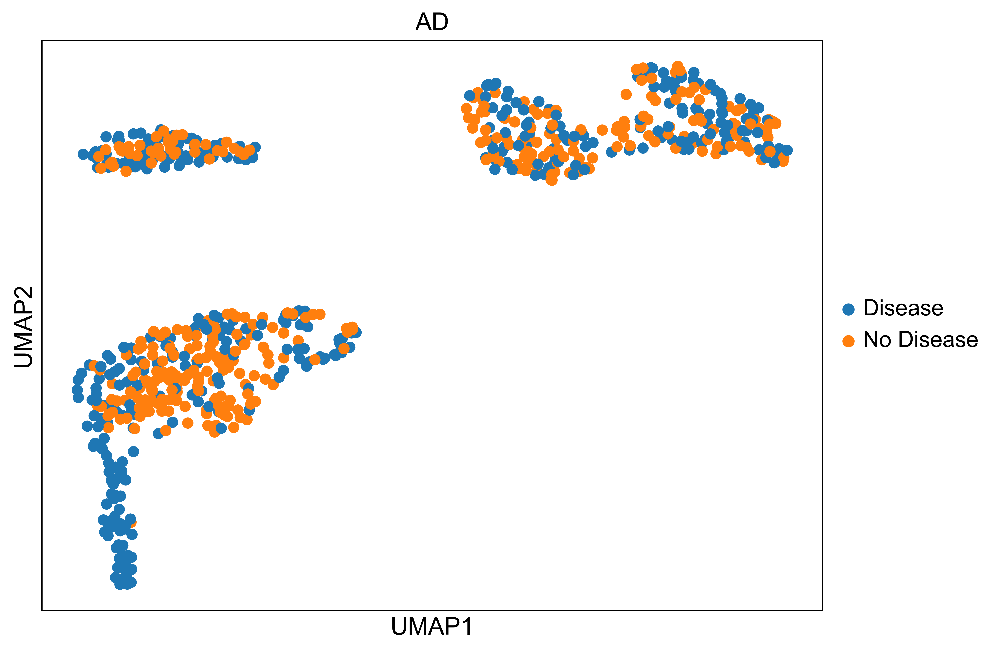

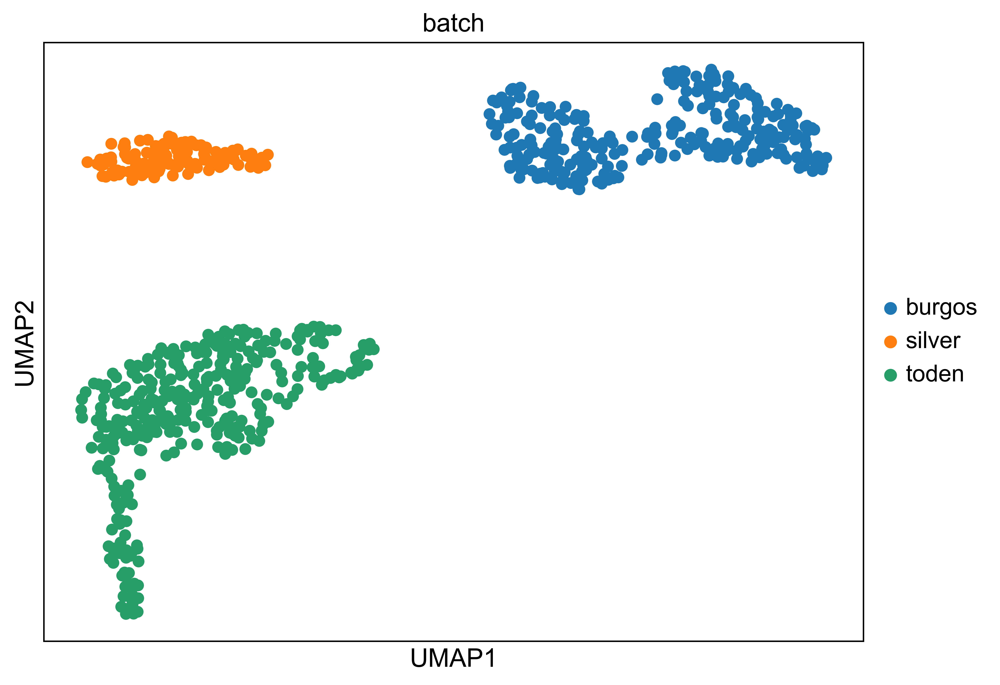

         Falling back to preprocessing with `sc.pp.pca` and default params.


... storing 'AD' as categorical


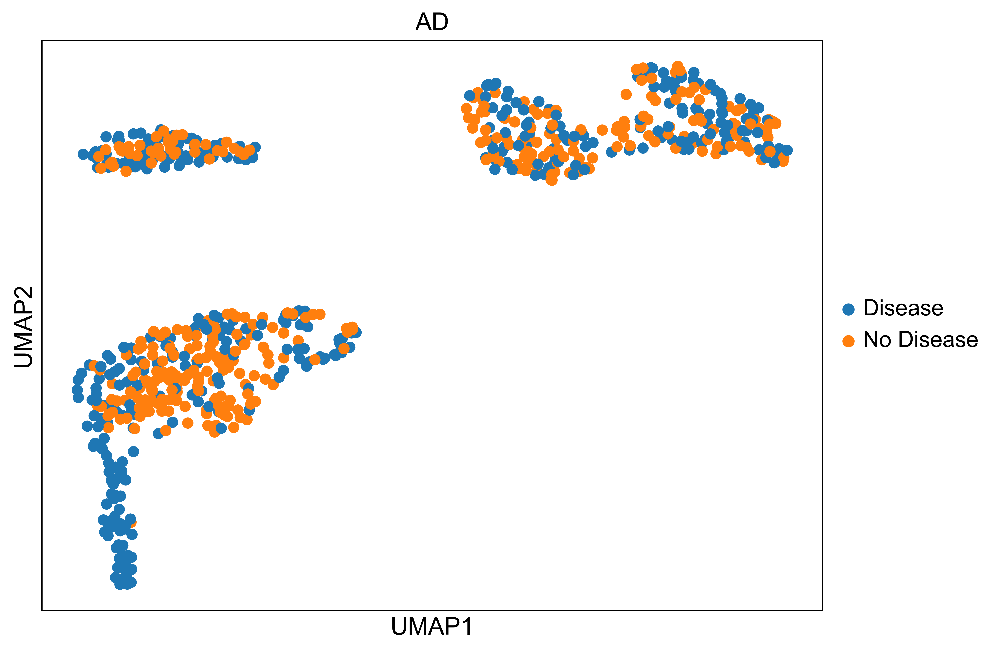

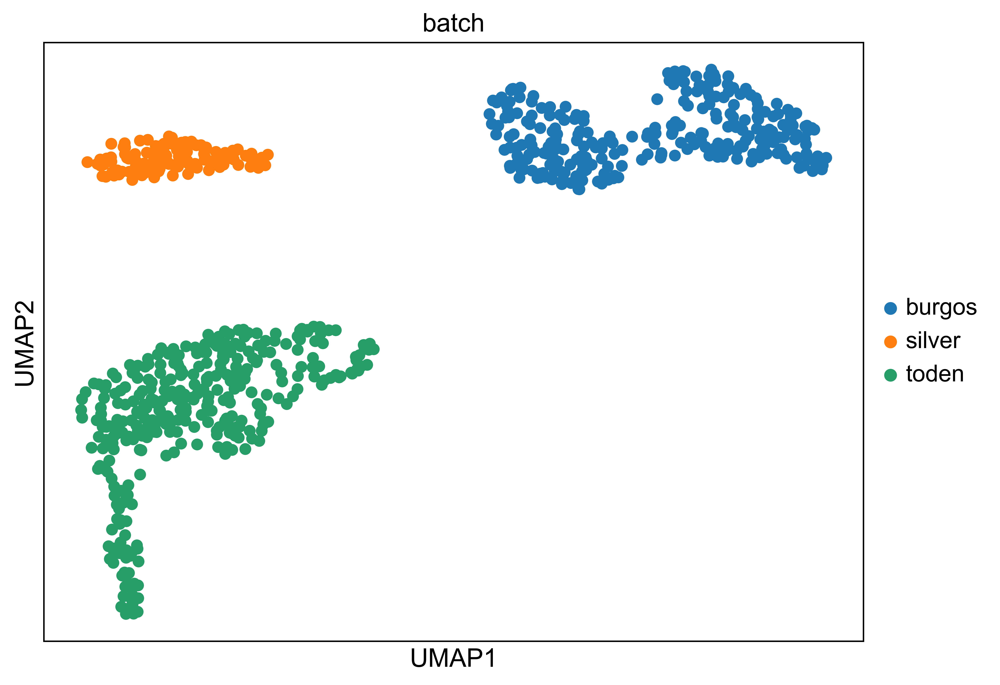

In [30]:
# Plot UMAP for HVG
sc.pp.neighbors(adata_combined_hvg_fpkm)
sc.tl.umap(adata_combined_hvg_fpkm)
sc.pl.umap(adata_combined_hvg_fpkm, color=["AD"], save="_combined_disease_fpkm_hvg.png")
sc.pl.umap(adata_combined_hvg_fpkm, color=["batch"], save="_combined_batch_fpkm_hvg.png")

sc.pp.neighbors(adata_combined_hvg_tpm)
sc.tl.umap(adata_combined_hvg_tpm)
sc.pl.umap(adata_combined_hvg_tpm, color=["AD"], save="_combined_disease_tpm_hvg.png")
sc.pl.umap(adata_combined_hvg_tpm, color=["batch"], save="_combined_batch_tpm_hvg.png")

## Neural Networks

AnnData object with n_obs × n_vars = 334 × 56432
    obs: 'Disease', 'AD'

In [81]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from random import shuffle

class RNASeqDataset(Dataset):
    def __init__(self, adata):
        self.X = adata.X.astype(np.float32)
        # concat apoe into X
        # self.X = np.concatenate((self.X, adata.obs["APOE"].values.reshape(-1, 1)), axis=1)
        self.y = [1 if val == "Disease" else 0 for val in adata.obs["AD"].values]
        self.gene_names = adata.var.index.to_list()
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]
    

class MLP(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, dropout_rate=0.1):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.fc2(x)
        return x

    
def train_model(model, train_loader, test_loader, epochs=10, lr=0.001):
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    
    for epoch in range(epochs):
        model.train()
        for X, y in train_loader:
            optimizer.zero_grad()
            y_pred = model(X)
            loss = criterion(y_pred, y)
            loss.backward()
            optimizer.step()
        
        model.eval()
        # Train accuracy
        train_correct, train_total = 0, 0
        for X, y in train_loader:
            y_pred = model(X)
            _, predicted = torch.max(y_pred, 1)
            train_total += y.size(0)
            train_correct += (predicted == y).sum().item()

        # Test accuracy
        test_correct, test_total = 0, 0
        for X, y in test_loader:
            y_pred = model(X)
            _, predicted = torch.max(y_pred, 1)
            test_total += y.size(0)
            test_correct += (predicted == y).sum().item()

        print(f"Epoch {epoch+1}/{epochs}, Train accuracy: {train_correct/train_total:.2f}, Test accuracy: {test_correct/test_total:.2f}")

def split_data(adata, dataset_specific=None):
    if dataset_specific is not None:
        adata = adata[adata.obs["batch"] == dataset_specific]

    len_samples = adata.X.shape[0]
    train_size = int(0.8 * len_samples)
    indices = list(range(len_samples))
    shuffle(indices)
    train_indices = indices[:train_size]
    test_indices = indices[train_size:]
    return adata[train_indices], adata[test_indices]

train_data, test_data = split_data(adata_combined_hvg_fpkm, "burgos")

train_dataset = RNASeqDataset(train_data)
test_dataset = RNASeqDataset(test_data)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [82]:
model = MLP(input_size=train_dataset.X.shape[1], hidden_size=32, output_size=2, dropout_rate=0.15)
train_model(model, train_loader, test_loader, epochs=20, lr=0.001)

Epoch 1/20, Train accuracy: 0.57, Test accuracy: 0.54
Epoch 2/20, Train accuracy: 0.61, Test accuracy: 0.50
Epoch 3/20, Train accuracy: 0.64, Test accuracy: 0.54
Epoch 4/20, Train accuracy: 0.66, Test accuracy: 0.52
Epoch 5/20, Train accuracy: 0.71, Test accuracy: 0.63
Epoch 6/20, Train accuracy: 0.72, Test accuracy: 0.61
Epoch 7/20, Train accuracy: 0.73, Test accuracy: 0.59
Epoch 8/20, Train accuracy: 0.75, Test accuracy: 0.67
Epoch 9/20, Train accuracy: 0.76, Test accuracy: 0.67
Epoch 10/20, Train accuracy: 0.77, Test accuracy: 0.72
Epoch 11/20, Train accuracy: 0.78, Test accuracy: 0.72
Epoch 12/20, Train accuracy: 0.80, Test accuracy: 0.72
Epoch 13/20, Train accuracy: 0.82, Test accuracy: 0.72
Epoch 14/20, Train accuracy: 0.80, Test accuracy: 0.70
Epoch 15/20, Train accuracy: 0.82, Test accuracy: 0.70
Epoch 16/20, Train accuracy: 0.84, Test accuracy: 0.69
Epoch 17/20, Train accuracy: 0.83, Test accuracy: 0.70
Epoch 18/20, Train accuracy: 0.84, Test accuracy: 0.70
Epoch 19/20, Train 

In [101]:
adata_combined_fpkm.write("../datasets/datasets_h5ad/combined/combined_fpkm.h5ad")
adata_combined_tpm.write("../datasets/datasets_h5ad/combined/combined_tpm.h5ad")

adata_combined_hvg_fpkm.write("../datasets/datasets_h5ad/combined/combined_hvg_fpkm.h5ad")
adata_combined_hvg_tpm.write("../datasets/datasets_h5ad/combined/combined_hvg_tpm.h5ad")

... storing 'AD' as categorical
... storing 'AD' as categorical


## Consider adding ApoE

In [98]:
meta_burgos[["ApoE"]].value_counts()

ApoE
3/3     129
3/4      95
2/3      19
4/4      12
2/2       6
2/4       2
Name: count, dtype: int64

In [99]:
meta_silver[["apoe"]].value_counts()

apoe
33      59
34      21
44      21
23      14
Name: count, dtype: int64

In [100]:
meta_toden[["Apoe.status"]].value_counts()

Apoe.status
E3/E3          57
E3/E4          41
E2/E3          15
E4/E4           6
E2/E4           4
Name: count, dtype: int64